### Adding smoothed gene expression data from here and doing the analysis

In [20]:
library(Seurat)
library(Matrix)
library(dplyr)

#--------------------------------------------------
# 1. Load original Seurat object
#--------------------------------------------------

obj <- readRDS(
  "/data/kumarr17/Spatial_transcriptomics_data/GSE238264/processed/GSE238264_combined_visium.rds"
)

# If your smoothed dataframe was saved previously:
out_df <- readRDS("/data/kumarr17/Spatial_transcriptomics_data/GSE238264/processed/smoothed_expression_radius2.rds")


#--------------------------------------------------
# 2. Identify gene columns
#--------------------------------------------------

meta_cols <- c(
  "spot_id",
  "sample",
  "response",
  "orig.ident"
)

gene_cols <- setdiff(
  colnames(out_df),
  meta_cols
)

length(gene_cols)

[1] 21479

In [21]:
#--------------------------------------------------
# 3. Check matching spots
#--------------------------------------------------

sum(out_df$spot_id %in% colnames(obj))
ncol(obj)
nrow(out_df)

# Check spots that don't match, if any
setdiff(out_df$spot_id, colnames(obj))[1:10]
setdiff(colnames(obj), out_df$spot_id)[1:10]

[1] 17292

[1] 17292

[1] 17292

[1] NA NA NA NA NA NA NA NA NA NA

[1] NA NA NA NA NA NA NA NA NA NA

In [22]:
#--------------------------------------------------
# 4. Put smoothed dataframe in Seurat spot order
#--------------------------------------------------

out_df_aligned <- out_df[
  match(colnames(obj), out_df$spot_id),
  ,
  drop = FALSE
]

stopifnot(
  all(out_df_aligned$spot_id == colnames(obj))
)

In [23]:
#--------------------------------------------------
# 5. Convert smoothed expression to genes x spots
#--------------------------------------------------

smoothed_mat <- as.matrix(
  out_df_aligned[, gene_cols, drop = FALSE]
)

# currently: spots x genes
dim(smoothed_mat)

# transpose to Seurat format:
# genes x spots
smoothed_mat <- t(smoothed_mat)

dim(smoothed_mat)

[1] 17292 21479

[1] 21479 17292

In [24]:
#--------------------------------------------------
# 6. Create Smoothed assay
#--------------------------------------------------

smoothed_mat <- Matrix(
  smoothed_mat,
  sparse = TRUE
)

obj[["Smoothed"]] <- CreateAssayObject(
  data = smoothed_mat
)

obj

Warning message:
“Layer counts isn't present in the assay object; returning NULL”


An object of class Seurat 
79559 features across 17292 samples within 3 assays 
Active assay: SCT (21479 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: Spatial, Smoothed
 2 dimensional reductions calculated: pca, umap
 7 spatial fields of view present: HCC1R HCC2R HCC3R HCC4R HCC5NR HCC6NR HCC7NR

In [25]:
### Adding spot probablities here
pred_df <- read.csv(
  "/data/kumarr17/fixed_feature_cyt_result/ST_result/hcc_spot_groupkfold_probabilities.csv",
  stringsAsFactors = FALSE
)

rownames(pred_df) <- pred_df$spot_id

# Align to Seurat spots
pred_df <- pred_df[
  match(colnames(obj), pred_df$spot_id),
  ,
  drop = FALSE
]

stopifnot(
  all(pred_df$spot_id == colnames(obj))
)

obj$prob_responder <- pred_df$prob_responder
obj$prob_nonresponder <- pred_df$prob_nonresponder
obj$cv_sample <- pred_df$sample
obj$cv_response <- pred_df$response

In [26]:
signatures <- list(

  CD8_Tcell = c(
    "CD3D",
    "CD3E",
    "CD3G",
    "CD8A",
    "CD8B"
  ),

  Cytotoxic = c(
    "GZMB",
    "PRF1",
    "NKG7",
    "GNLY"
  ),

  IFNG_response = c(
    "IFNG",
    "CXCL9",
    "CXCL10",
    "STAT1",
    "IRF1"
  ),

  Exhaustion = c(
    "PDCD1",
    "LAG3",
    "TIGIT",
    "HAVCR2",
    "CTLA4"
  )
)

In [27]:
smoothed_expr <- GetAssayData(
  obj,
  assay = "Smoothed",
  layer = "data"
)

dim(smoothed_expr)

[1] 21479 17292

In [28]:
lapply(
  signatures,
  function(x) intersect(x, rownames(smoothed_expr))
)

$CD8_Tcell
[1] "CD3D" "CD3E" "CD3G" "CD8A" "CD8B"

$Cytotoxic
[1] "GZMB" "PRF1" "NKG7" "GNLY"

$IFNG_response
[1] "IFNG"   "CXCL9"  "CXCL10" "STAT1"  "IRF1"  

$Exhaustion
[1] "PDCD1"  "LAG3"   "TIGIT"  "HAVCR2" "CTLA4"

In [29]:
for (sig in names(signatures)) {

  genes_use <- intersect(
    signatures[[sig]],
    rownames(smoothed_expr)
  )

  cat(
    sig,
    ":",
    paste(genes_use, collapse = ", "),
    "\n"
  )

  obj[[paste0(sig, "_score")]] <-
    Matrix::colMeans(
      smoothed_expr[
        genes_use,
        ,
        drop = FALSE
      ]
    )
}

CD8_Tcell : CD3D, CD3E, CD3G, CD8A, CD8B 
Cytotoxic : GZMB, PRF1, NKG7, GNLY 
IFNG_response : IFNG, CXCL9, CXCL10, STAT1, IRF1 
Exhaustion : PDCD1, LAG3, TIGIT, HAVCR2, CTLA4 


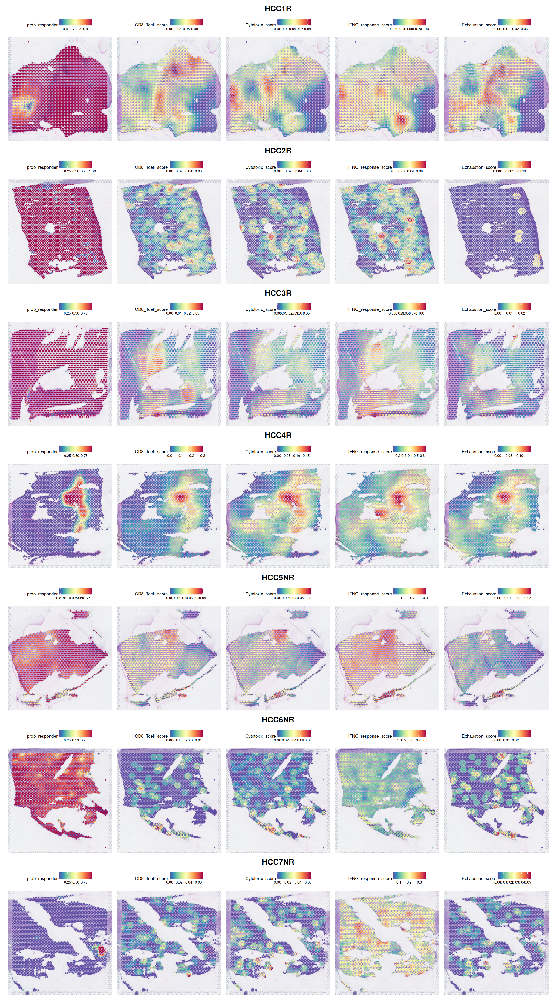

In [30]:
library(Seurat)
library(patchwork)
library(ggplot2)

options(repr.plot.width = 20, repr.plot.height = 36)

samples <- c(
  "HCC1R",
  "HCC2R",
  "HCC3R",
  "HCC4R",
  "HCC5NR",
  "HCC6NR",
  "HCC7NR"
)

features <- c(
  "prob_responder",
  "CD8_Tcell_score",
  "Cytotoxic_score",
  "IFNG_response_score",
  "Exhaustion_score"
)

out_dir <- "/data/kumarr17/cytokine_figure_directory/"

dir.create(
  out_dir,
  showWarnings = FALSE,
  recursive = TRUE
)

all_plots <- list()

for (sample_use in samples) {

  obj_sub <- suppressWarnings(
    subset(
      obj,
      subset = sample == sample_use
    )
  )

  # 5 spatial plots
  p_spatial <- suppressWarnings(
    SpatialFeaturePlot(
      obj_sub,
      features = features,
      pt.size.factor = 1.6,
      ncol = 5
    )
  )

  # ---------------------------------------------
  # Separate title panel
  # ---------------------------------------------
  p_title <- ggplot() +
    annotate(
      "text",
      x = 0.5,
      y = 0.5,
      label = sample_use,
      size = 7,
      fontface = "bold"
    ) +
    xlim(0, 1) +
    ylim(0, 1) +
    theme_void()

  # ---------------------------------------------
  # Title ABOVE spatial plots
  # ---------------------------------------------
  p_sample <- p_title / p_spatial +
    plot_layout(
      heights = c(0.12, 1)
    )

  all_plots[[sample_use]] <- p_sample
}

# ---------------------------------------------
# Stack all 7 samples vertically
# ---------------------------------------------

final_plot <- wrap_plots(
  all_plots,
  ncol = 1
)

# Display
suppressWarnings(
  print(final_plot)
)

# ---------------------------------------------
# Save SVG
# ---------------------------------------------

#ggsave(
#  filename = file.path(
#    out_dir,
#    "HCC_all_slides_spatial_immune_signatures.svg"
#  ),
#  plot = final_plot,
#  device = "svg",
#  width = 20,
#  height = 36,
#  units = "in",
#  limitsize = FALSE
#)

# ---------------------------------------------
# Save PDF
# ---------------------------------------------

#ggsave(
#  filename = file.path(
#    out_dir,
#    "HCC_all_slides_spatial_immune_signatures.pdf"
#  ),
#  plot = final_plot,
#  device = cairo_pdf,
#  width = 20,
#  height = 36,
#  units = "in",
#  limitsize = FALSE
#)